In [1]:
import anndata as ad
import pandas as pd
import scanpy as sc
import torch
import umap
import numpy as np
import matplotlib.pyplot as plt
import dask.dataframe as dd
import seaborn as sns
import yaml

/projects/b1042/GoyalLab/jaekj/python/DL_py3.10/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Paths
DATA_PATH = '/projects/b1042/GoyalLab/jaekj/merlin_cxg_2023_05_15_sf-log1p'
YAML_PATH = '/projects/b1042/GoyalLab/jaekj/SCTAB_FINAL/scTab-devel/notebooks/data_augmentation/shortend_cell_types.yaml'

In [3]:
# Load test labels
print("Loading test labels...")
from os.path import join
y_test_names = dd.read_parquet(join(DATA_PATH, 'test'), columns=['cell_type']).compute()['cell_type'].values

# Load cell type mapping
print("Loading cell type mapping...")
from os.path import join
cell_type_mapping = pd.read_parquet(join(DATA_PATH, 'categorical_lookup/cell_type.parquet'))

# Load shortened cell type names
with open(YAML_PATH, 'r') as f:
    shortend_cell_types = yaml.safe_load(f)

# Create reverse mapping from index to cell type name
idx_to_celltype = dict(zip(cell_type_mapping.index, cell_type_mapping['label']))

# Load cell type hierarchy
cell_type_hierarchy = np.load(join(DATA_PATH, 'cell_type_hierarchy/child_matrix.npy'))

# Load general tissue type
tissue_general = dd.read_parquet(join(DATA_PATH, 'test'), columns='tissue_general').compute().to_numpy()

# Load tissue type mapping
tissue_general_mapping = pd.read_parquet(join(DATA_PATH, 'categorical_lookup/tissue_general.parquet'))

# Load embeddings
print("Loading embeddings...")
test = torch.load("test_embedding.pt", map_location="cpu")

Loading test labels...
Loading cell type mapping...
Loading embeddings...


In [4]:
# Map test labels to cell type names
y_test_celltype_names = [idx_to_celltype[idx] for idx in y_test_names]

# Apply shortened names
y_test_display_names = [shortend_cell_types.get(name, name) for name in y_test_celltype_names]

In [5]:
# Convert embeddings to numpy if needed
# Extract embeddings from dictionary
# Common keys: 'embeddings', 'embedding', 'features', 'X'
print(f"Available keys in test dict: {test.keys()}")

# Try common key names
test_embeddings = test['X']
if isinstance(test_embeddings, torch.Tensor):
    test_embeddings = test_embeddings.numpy()

print(f"Embedding shape: {test_embeddings.shape}")
print(f"Number of labels: {len(y_test_display_names)}")


Available keys in test dict: dict_keys(['X', 'y_true', 'y_pred'])
Embedding shape: (3448832, 128)
Number of labels: 3448832


In [6]:
y_true = test["y_true"]

In [7]:
y_true = np.asarray(y_true).flatten()
tissue_general = np.asarray(tissue_general).flatten()

In [8]:
adata = ad.AnnData(
    X=test["X"].cpu().numpy(), 
    obs=pd.DataFrame({
        'y_true': cell_type_mapping.loc[y_true].to_numpy().flatten(), 
        'tissue': tissue_general_mapping.loc[tissue_general].to_numpy().flatten()
    })
)

/projects/b1042/GoyalLab/jaekj/python/DL_py3.10/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [9]:
adata.obs.y_true

0                                           precursor B cell
1                                                     neuron
2                            CD8-positive, alpha-beta T cell
3                                 CD4-positive helper T cell
4                            CD4-positive, alpha-beta T cell
                                 ...                        
3448827                                               neuron
3448828                                  natural killer cell
3448829    L2/3-6 intratelencephalic projecting glutamate...
3448830                                               neuron
3448831                                   type II pneumocyte
Name: y_true, Length: 3448832, dtype: object

In [10]:
# sub-sample 200,000
# apply tSNE
sc.pp.subsample(adata, n_obs=200_000)
sc.tl.tsne(adata, use_rep='X')

In [11]:
adata.write_h5ad('embedding_prediction_200000_subsampled.h5ad')

In [12]:
adata = ad.read_h5ad('embedding_prediction_200000_subsampled.h5ad')

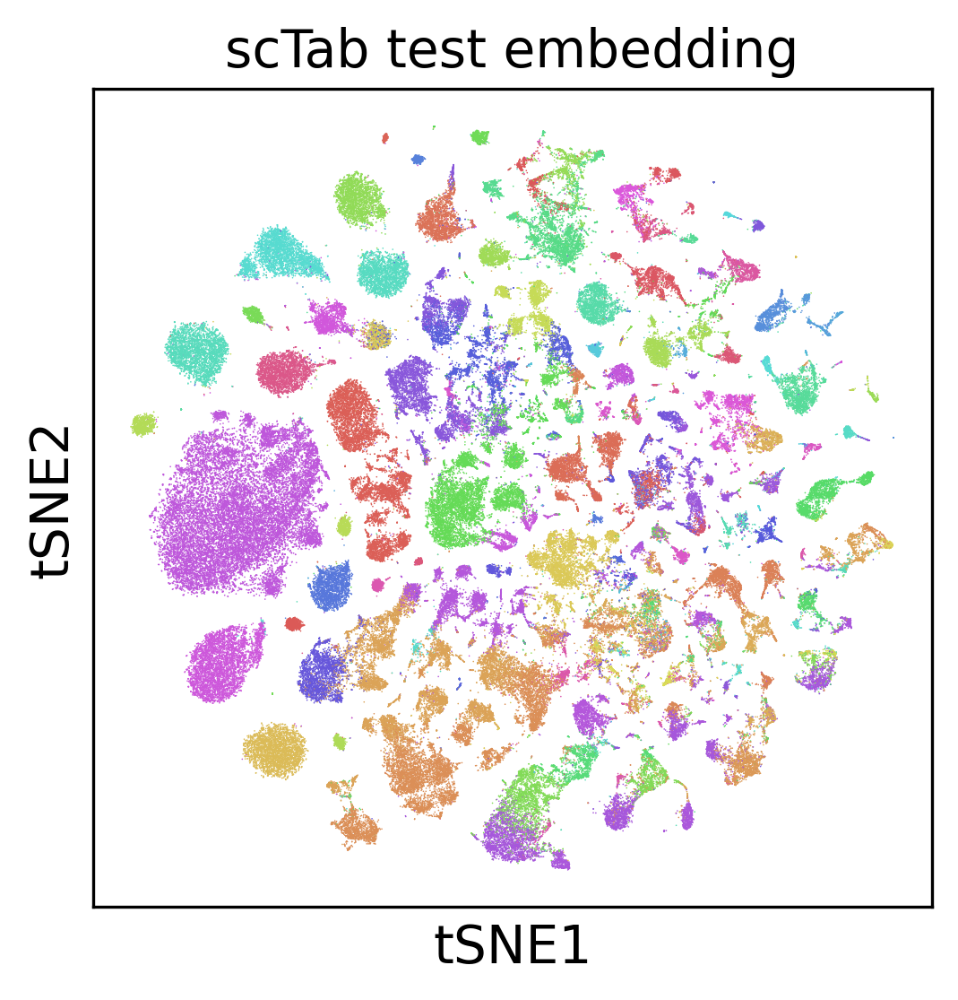

In [13]:
plt.rcParams['figure.figsize'] = (5, 5)

cell_freq = adata.obs.y_true.value_counts()
# only plot most frequent cell types to not overload the color scale
cells_to_plot = cell_freq.index.tolist()
adata_plot = adata.copy()
adata_plot.obs['y_true'] = adata_plot.obs.y_true.mask(~adata_plot.obs.y_true.isin(cells_to_plot)).astype(str)

# convert to shortened cell type names
adata_plot.obs['y_true'] = (
    adata_plot.obs['y_true']
    .str.replace(r'[$]', '', regex=True)
    .str.replace(r'\\', '', regex=True)
)

n = adata_plot.obs["y_true"].nunique()
palette = sns.color_palette("hls", n)

adata_plot.obs["y_true"] = adata_plot.obs["y_true"].astype("category")

sc.settings.set_figure_params(dpi=150)

sc.pl.tsne(
    adata_plot,
    color="y_true",
    palette=palette,
    # legend_fontsize='x-small',
    legend_loc=None,        # <-- removes legend
    ncols=1,
    title='scTab test embedding',
    save='tSNE_subsampled_test_embedding_no_legends_dpi150.png'
)

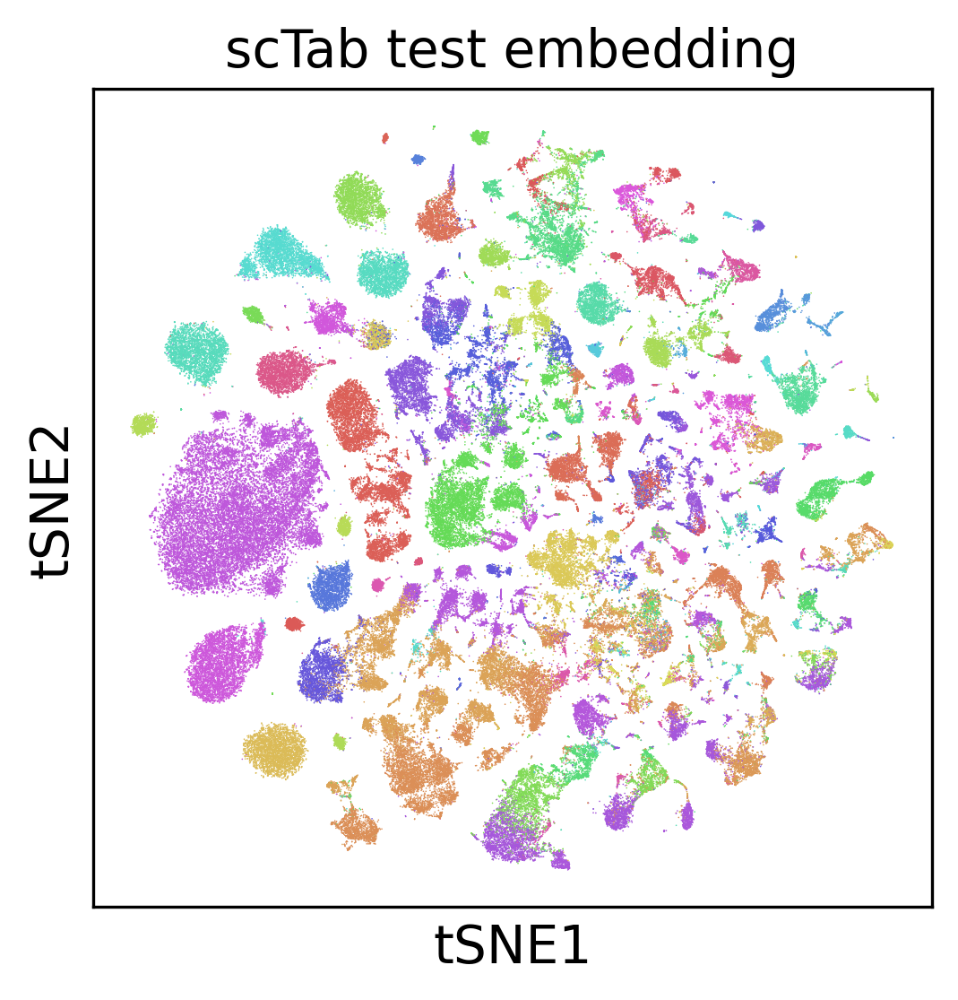

In [14]:
sc.settings.set_figure_params(dpi=150)

sc.pl.tsne(
    adata_plot,
    color="y_true",
    palette=palette,
    # legend_fontsize='x-small',
    legend_loc=None,        # <-- removes legend
    ncols=1,
    title='scTab test embedding',
    save='tSNE_subsampled_test_embedding_no_legends_dpi150.svg'
)

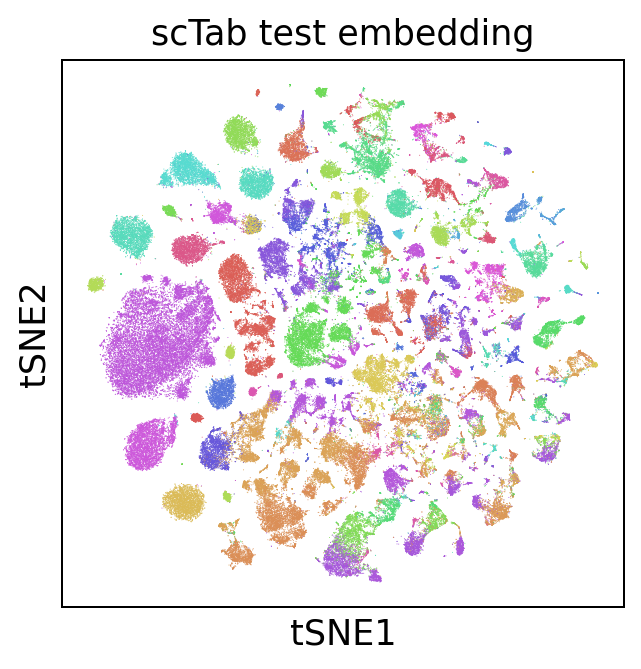

In [15]:
plt.rcParams['figure.figsize'] = (5, 5)

cell_freq = adata.obs.y_true.value_counts()
# only plot most frequent cell types to not overload the color scale
cells_to_plot = cell_freq.index.tolist()
adata_plot = adata.copy()
adata_plot.obs['y_true'] = adata_plot.obs.y_true.mask(~adata_plot.obs.y_true.isin(cells_to_plot)).astype(str)

# convert to shortened cell type names
adata_plot.obs['y_true'] = (
    adata_plot.obs['y_true']
    .str.replace(r'[$]', '', regex=True)
    .str.replace(r'\\', '', regex=True)
)

n = adata_plot.obs["y_true"].nunique()
palette = sns.color_palette("hls", n)

adata_plot.obs["y_true"] = adata_plot.obs["y_true"].astype("category")

sc.settings.set_figure_params(dpi=90)

sc.pl.tsne(
    adata_plot,
    color="y_true",
    palette=palette,
    # legend_fontsize='x-small',
    legend_loc=None,        # <-- removes legend
    ncols=1,
    title='scTab test embedding',
    save='tSNE_subsampled_test_embedding_no_legends_dpi90.png'
)

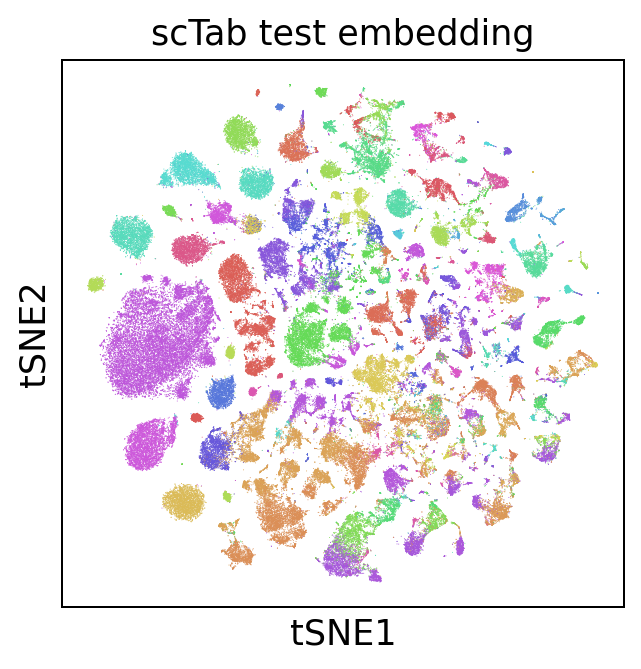

In [16]:
sc.settings.set_figure_params(dpi=90)

sc.pl.tsne(
    adata_plot,
    color="y_true",
    palette=palette,
    # legend_fontsize='x-small',
    legend_loc=None,        # <-- removes legend
    ncols=1,
    title='scTab test embedding',
    save='tSNE_subsampled_test_embedding_no_legends_dpi90.svg'
)

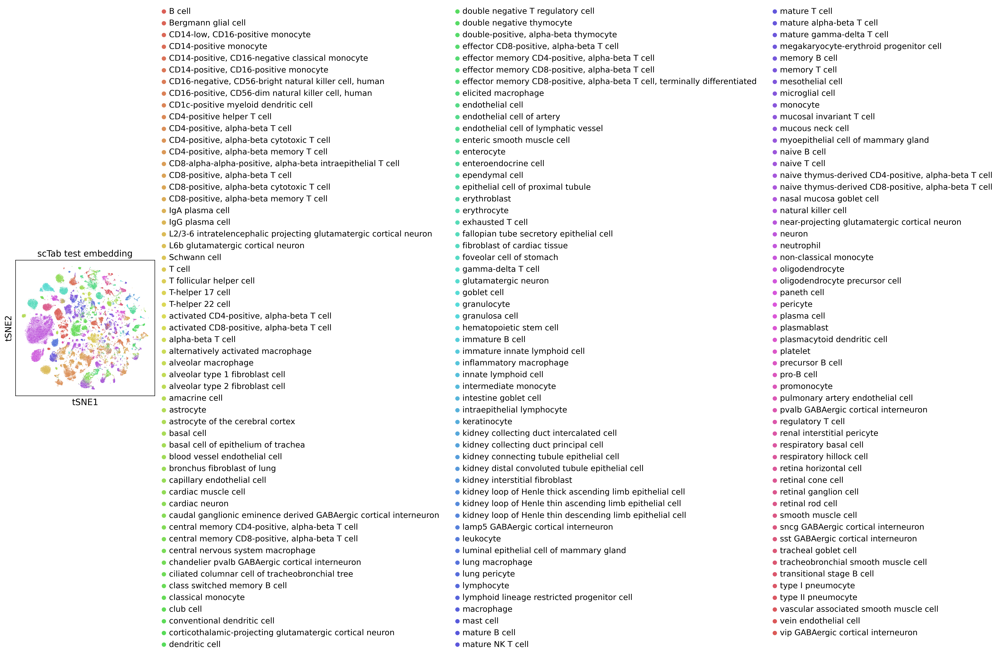

In [17]:
plt.rcParams['figure.figsize'] = (5, 5)

cell_freq = adata.obs.y_true.value_counts()
# only plot most frequent cell types to not overload the color scale
cells_to_plot = cell_freq.index.tolist()
adata_plot = adata.copy()
adata_plot.obs['y_true'] = adata_plot.obs.y_true.mask(~adata_plot.obs.y_true.isin(cells_to_plot)).astype(str)

# convert to shortened cell type names
adata_plot.obs['y_true'] = (
    adata_plot.obs['y_true']
    .str.replace(r'[$]', '', regex=True)
    .str.replace(r'\\', '', regex=True)
)

n = adata_plot.obs["y_true"].nunique()
palette = sns.color_palette("hls", n)

adata_plot.obs["y_true"] = adata_plot.obs["y_true"].astype("category")

sc.settings.set_figure_params(dpi=150)

sc.pl.tsne(
    adata_plot,
    color="y_true",
    palette=palette,
    # legend_fontsize='x-small',
    ncols=1,
    title='scTab test embedding',
    save='tSNE_subsampled_test_embedding_with_legends_dpi150.png'
)

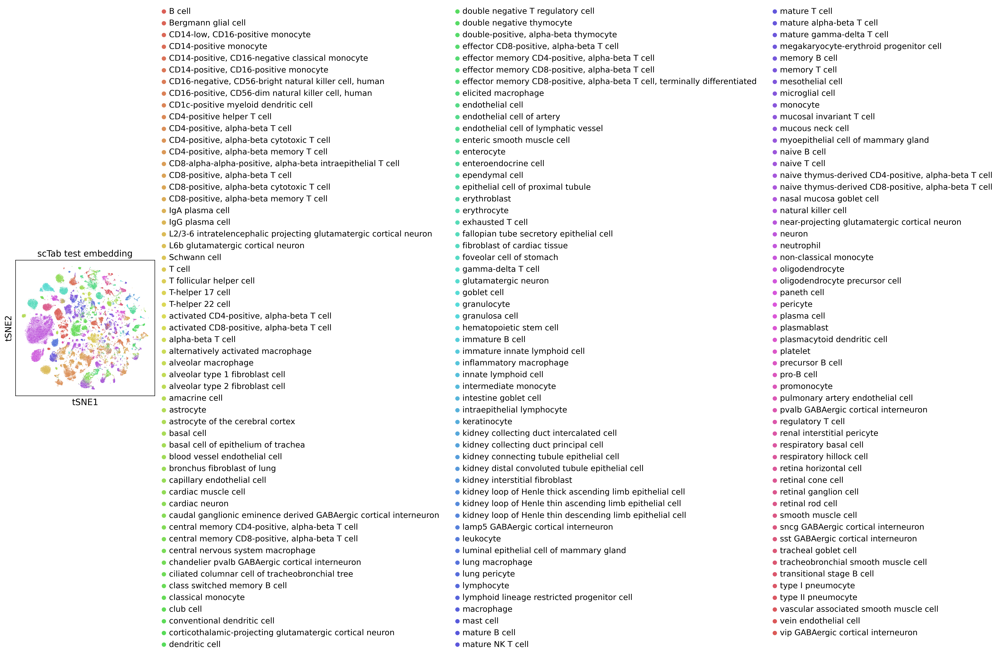

In [18]:
sc.settings.set_figure_params(dpi=150)

sc.pl.tsne(
    adata_plot,
    color="y_true",
    palette=palette,
    # legend_fontsize='x-small',
    ncols=1,
    title='scTab test embedding',
    save='tSNE_subsampled_test_embedding_no_legends_dpi150.svg'
)

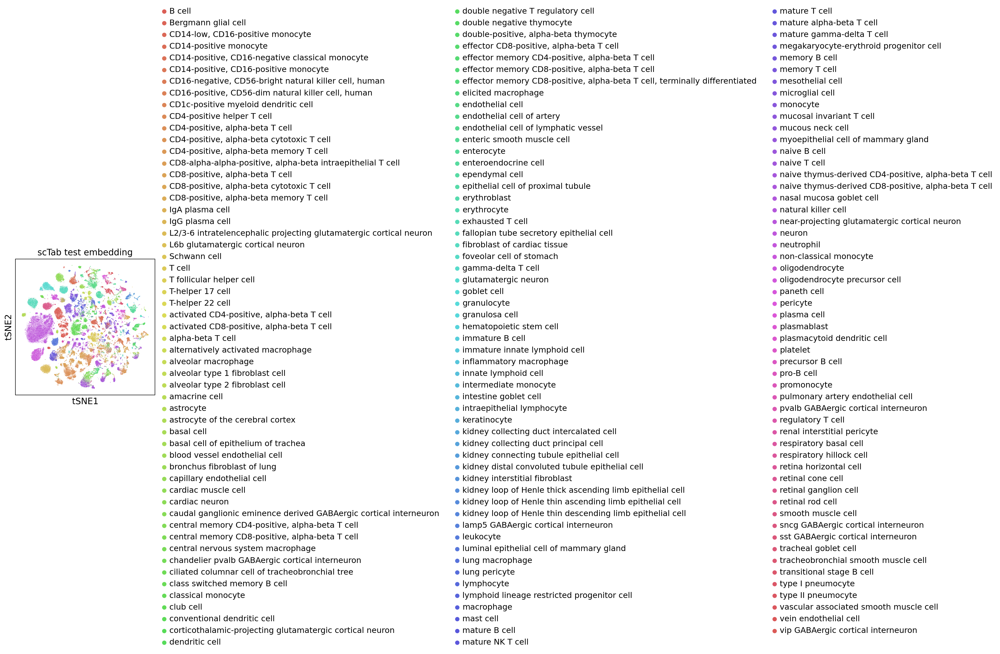

In [19]:
plt.rcParams['figure.figsize'] = (5, 5)

cell_freq = adata.obs.y_true.value_counts()
# only plot most frequent cell types to not overload the color scale
cells_to_plot = cell_freq.index.tolist()
adata_plot = adata.copy()
adata_plot.obs['y_true'] = adata_plot.obs.y_true.mask(~adata_plot.obs.y_true.isin(cells_to_plot)).astype(str)

# convert to shortened cell type names
adata_plot.obs['y_true'] = (
    adata_plot.obs['y_true']
    .str.replace(r'[$]', '', regex=True)
    .str.replace(r'\\', '', regex=True)
)

n = adata_plot.obs["y_true"].nunique()
palette = sns.color_palette("hls", n)

adata_plot.obs["y_true"] = adata_plot.obs["y_true"].astype("category")

sc.settings.set_figure_params(dpi=90)

sc.pl.tsne(
    adata_plot,
    color="y_true",
    palette=palette,
    # legend_fontsize='x-small',
    ncols=1,
    title='scTab test embedding',
    save='tSNE_subsampled_test_embedding_with_legends_dpi90.png'
)

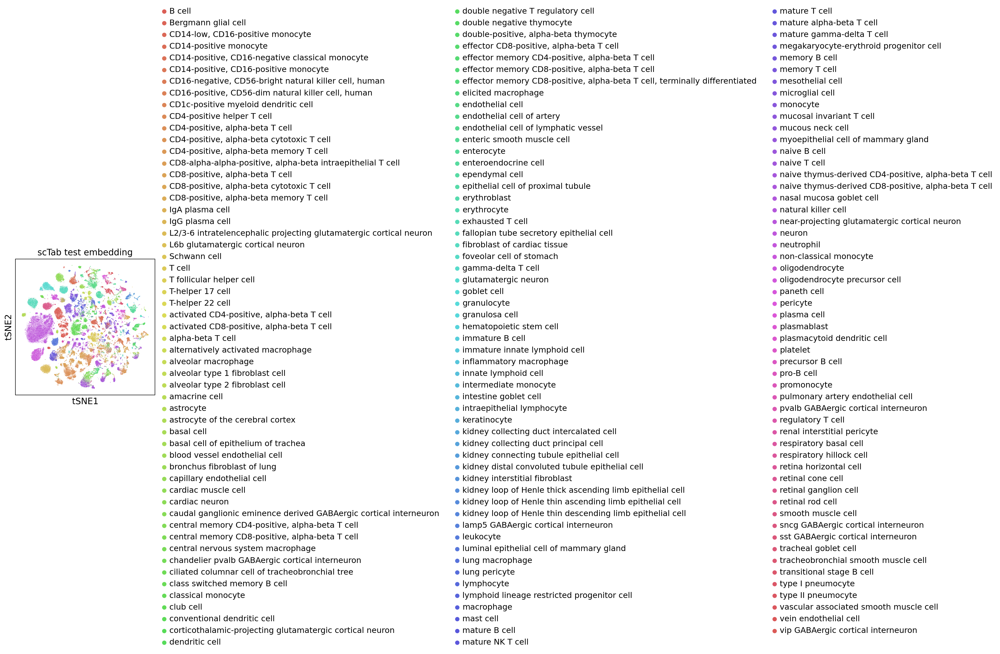

In [20]:
sc.settings.set_figure_params(dpi=90)

sc.pl.tsne(
    adata_plot,
    color="y_true",
    palette=palette,
    # legend_fontsize='x-small',
    ncols=1,
    title='scTab test embedding',
    save='tSNE_subsampled_test_embedding_no_legends_dpi90.svg'
)

In [18]:
unique_cell_types = adata_plot.obs["y_true"].unique()
print("Number of cell types in plot:", len(unique_cell_types))
print("Cell types:", unique_cell_types)

Number of cell types in plot: 164
Cell types: ['classical monocyte', 'CD14-positive, CD16-negative classical monocyte', 'gamma-delta T cell', 'fibroblast of cardiac tissue', 'CD14-low, CD16-positive monocyte', ..., 'lung pericyte', 'retinal cone cell', 'alveolar type 1 fibroblast cell', 'lymphoid lineage restricted progenitor cell', 'erythroblast']
Length: 164
Categories (164, object): ['B cell', 'Bergmann glial cell', 'CD14-low, CD16-positive monocyte', 'CD14-positive monocyte', ..., 'type II pneumocyte', 'vascular associated smooth muscle cell', 'vein endothelial cell', 'vip GABAergic cortical interneuron']


In [ ]:
plt.rcParams['figure.figsize'] = (5, 5)

cell_freq = test_embeddings.obs.y_true.value_counts()
# only plot most frequent cell types to not overload the color scale
cells_to_plot = test_embeddings.index.tolist()[:70]
adata_plot = test_embeddings.copy()
adata_plot.obs['y'] = adata_plot.obs.y_pred.mask(~adata_plot.obs.y_pred.isin(cells_to_plot)).astype(str)

# convert to shortened cell type names
adata_plot.obs['y'] = adata_plot.obs['y'].replace(shortend_cell_types)

ax = sc.pl.tsne(adata_plot, color='y', legend_fontsize='x-small', ncols=1, title='Learned features of scTab', show=False)
ax.get_legend().remove()

In [ ]:
# Build Anndata
adata = anndata.AnnData(
    X=np.load(join(DATA_PATH, 'pca/x_pca_test_50.npy')), 
    obs=pd.DataFrame({
        'y_true': cell_type_mapping.loc[y_true].to_numpy().flatten(), 
        'y_pred': cell_type_mapping.loc[y_pred_corr].to_numpy().flatten(),
        'tissue': tissue_general_mapping.loc[tissue_general].to_numpy().flatten()
    })
)
adata.obs['wrong_prediction'] = (adata.obs.y_true != adata.obs.y_pred).astype(str).astype('category')

In [ ]:
# Subsample if dataset is too large (optional, for faster computation)
MAX_SAMPLES = 50000
if test_embeddings.shape[0] > MAX_SAMPLES:
    print(f"Subsampling to {MAX_SAMPLES} cells for faster t-SNE computation...")
    indices = np.random.choice(test_embeddings.shape[0], MAX_SAMPLES, replace=False)
    test_embeddings_subset = test_embeddings[indices]
    y_test_subset = [y_test_display_names[i] for i in indices]
else:
    test_embeddings_subset = test_embeddings
    y_test_subset = y_test_display_names

In [ ]:
# Compute t-SNE
print("Computing t-SNE (this may take a while)...")
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000, verbose=1)
embeddings_2d = tsne.fit_transform(test_embeddings_subset)

In [ ]:
# Create DataFrame for plotting
tsne_df = pd.DataFrame({
    'tsne1': embeddings_2d[:, 0],
    'tsne2': embeddings_2d[:, 1],
    'cell_type': y_test_subset
})

# Get unique cell types and assign colors
unique_cell_types = sorted(set(y_test_subset))
n_types = len(unique_cell_types)
print(f"Number of unique cell types: {n_types}")

In [ ]:
# Create color palette
if n_types <= 20:
    palette = sns.color_palette("tab20", n_types)
else:
    palette = sns.color_palette("husl", n_types)

# Create the plot
fig, ax = plt.subplots(figsize=(16, 12))

for i, cell_type in enumerate(unique_cell_types):
    mask = tsne_df['cell_type'] == cell_type
    ax.scatter(
        tsne_df.loc[mask, 'tsne1'],
        tsne_df.loc[mask, 'tsne2'],
        c=[palette[i]],
        label=cell_type,
        alpha=0.6,
        s=10,
        edgecolors='none'
    )

ax.set_xlabel('t-SNE 1', fontsize=14)
ax.set_ylabel('t-SNE 2', fontsize=14)
ax.set_title('t-SNE Visualization of Cell Type Embeddings', fontsize=16, fontweight='bold')

# Handle legend - if too many cell types, create a more compact legend
if n_types <= 30:
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, markerscale=2)
else:
    # For many cell types, save legend separately or skip
    print("Too many cell types for legend. Skipping legend in main plot.")

plt.tight_layout()
plt.savefig('tsne_cell_types.png', dpi=300, bbox_inches='tight')
print("Plot saved as 'tsne_cell_types.png'")
plt.show()

In [11]:
import pandas as pd
import dask.dataframe as dd
from os.path import join

DATA_PATH = '/projects/b1042/GoyalLab/jaekj/merlin_cxg_2023_05_15_sf-log1p'
cell_type_mapping = pd.read_parquet(join(DATA_PATH, 'categorical_lookup/cell_type.parquet'))

In [ ]:
cell_type_mapping

In [ ]:
import anndata as ad
import pandas as pd
import torch

# assume: data = torch.load(...)
X = test["X"]
y = test["y"]

# convert to numpy
if isinstance(X, torch.Tensor):
    X = X.numpy()
if isinstance(y, torch.Tensor):
    y = y.numpy().reshape(-1)  # flatten shape (n,) instead of (n,1)

# build AnnData
adata = ad.AnnData(
    X=X,
    obs=pd.DataFrame({"y": y.astype(str)})
)

In [6]:
import yaml

with open('/projects/b1042/GoyalLab/jaekj/SCTAB_FINAL/scTab-devel/notebooks/data_augmentation/shortend_cell_types.yaml', 'r') as f:
    shortend_cell_types = yaml.safe_load(f)

adata.obs["y"] = adata.obs["y"].replace(shortend_cell_types)

In [ ]:
import scanpy as sc
# -------------------------------
# Compute t-SNE (this is required!)
# -------------------------------
sc.pp.neighbors(adata, use_rep="X")   # needed before tsne
sc.tl.tsne(adata)                     # computes adata.obsm["X_tsne"]

# -------------------------------
# Plot and save
# -------------------------------
plt.rcParams['figure.figsize'] = (5,5)

fig = sc.pl.tsne(
    adata,
    color="y",
    legend_fontsize="x-small",
    ncols=1,
    title="t-SNE of latent space",
    show=False
)

# Scanpy sometimes returns a list
if isinstance(fig, list):
    fig = fig[0]

fig.savefig("tsne_latent_y.png", dpi=300, bbox_inches="tight")
fig.savefig("tsne_latent_y.svg", bbox_inches="tight")